## Median filter

In [ ]:
%pip install opencv-python -q
%pip install PyWavelets
import cv2
from scipy import ndimage
from skimage.restoration import denoise_nl_means, estimate_sigma
import time
import numpy as np
import matplotlib.pyplot as plt

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1]:
# load image from npy file
original = np.load('../assets/nature/mse_calc/original_S20.npy')
noisy = np.load('../assets/nature/mse_calc/corrupted_S20.npy')
recovered = np.load('../assets/nature/mse_calc/recovered_S20.npy')

NameError: name 'np' is not defined

In [ ]:
recovered_filtered = cv2.medianBlur(recovered, 3)

In [ ]:
# plot images, 4 images in a row
cmap = plt.cm.gray
cmap.set_bad(color='red')
fig, axs = plt.subplots(1, 4, figsize=(200, 50))
# define font size to be 30 for all text
plt.rcParams.update({'font.size': 150})
axs[0].imshow(original, cmap='gray')
axs[0].set_title('Original')
axs[1].imshow(noisy, cmap=cmap)
axs[1].set_title('Noisy')
axs[2].imshow(recovered, cmap=cmap)
axs[2].set_title('Recovered')
axs[3].imshow(recovered_filtered, cmap=cmap)
axs[3].set_title('Recovered Filtered')
fig.suptitle('Denoising with Median Filter kernel=3 S=20', fontsize=250)
plt.tight_layout()
plt.savefig('../assets/nature/mse_calc/median_filter_K3_S20.png')
plt.show()

## Calculate MSE
- Calculate the mean squared error between the original image and the filtered image and the reconstructed image and the original image.

In [ ]:
# calculate MSE for original and recovered using each pixel
mse = np.sum((original.astype("float") - recovered.astype("float")) ** 2)
mse /= float(original.shape[0] * original.shape[1])
print(f"MSE for recovered: {mse}")

mse = np.sum((original.astype("float") - recovered_filtered.astype("float")) ** 2)
mse /= float(original.shape[0] * original.shape[1])
print(f"MSE for recovered filtered: {mse}")

MSE for recovered: 360.65850764250325
MSE for recovered filtered: 342.2613255090358


# Objetification of the process

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy import ndimage
from skimage.restoration import denoise_nl_means, estimate_sigma
import time
import os
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity
import warnings

# Ignore all warnings
warnings.filterwarnings('ignore')

class ImagePostProcessor:
    """
    A class for applying post-processing filters to reconstructed images and analyzing results.
    """
    
    def __init__(self, original=None, corrupted=None, reconstructed=None):
        """
        Initialize the ImagePostProcessor with images.
        
        Parameters:
        -----------
        original : numpy.ndarray
            Original uncorrupted image
        corrupted : numpy.ndarray
            Corrupted/noisy image
        reconstructed : numpy.ndarray
            Reconstructed image before post-processing
        """
        self.original = original
        self.corrupted = corrupted
        self.reconstructed = reconstructed
        self.filtered_images = {}
        self.metrics = {}
    
    def load_images_from_npy(self, original_path, corrupted_path, reconstructed_path):
        """
        Load images from .npy files.
        
        Parameters:
        -----------
        original_path : str
            Path to the original image .npy file
        corrupted_path : str
            Path to the corrupted image .npy file
        reconstructed_path : str
            Path to the reconstructed image .npy file
        """
        self.original = np.load(original_path)
        self.corrupted = np.load(corrupted_path)  # Keep as float with NaN values
        self.reconstructed = np.load(reconstructed_path)
        
        # Ensure original and reconstructed are uint8 for proper display and filtering
        self.original = np.clip(self.original, 0, 255).astype(np.uint8)
        self.reconstructed = np.clip(self.reconstructed, 0, 255).astype(np.uint8)
        # Corrupted image stays as float with NaN values
        
        print(f"Loaded images - Original shape: {self.original.shape}, "
              f"Corrupted shape: {self.corrupted.shape}, "
              f"Reconstructed shape: {self.reconstructed.shape}")
    
    def apply_median_filter(self, image=None, kernel_size=3):
        """
        Apply median filter to an image for noise reduction.
        
        Parameters:
        -----------
        image : numpy.ndarray or None
            Input image (if None, uses self.reconstructed)
        kernel_size : int
            Size of the median filter kernel (must be odd)
            
        Returns:
        --------
        numpy.ndarray
            Filtered image
        """
        if image is None:
            if self.reconstructed is None:
                raise ValueError("No reconstructed image available to filter")
            image = self.reconstructed
        
        if kernel_size % 2 == 0:
            kernel_size += 1  # Ensure kernel size is odd
            
        start_time = time.time()
        
        if len(image.shape) == 2:  # Grayscale image
            filtered_image = cv2.medianBlur(image.astype(np.uint8), kernel_size)
        else:  # Color image
            filtered_image = cv2.medianBlur(image.astype(np.uint8), kernel_size)
            
        elapsed_time = time.time() - start_time
        
        print(f"Median filter applied with kernel size {kernel_size} in {elapsed_time:.4f} seconds")
        
        filter_name = f"median{kernel_size}"
        self.filtered_images[filter_name] = filtered_image
        
        return filtered_image
    
    def apply_gaussian_filter(self, image=None, kernel_size=3, sigma=0):
        """
        Apply Gaussian filter to an image.
        
        Parameters:
        -----------
        image : numpy.ndarray or None
            Input image (if None, uses self.reconstructed)
        kernel_size : int
            Size of the Gaussian kernel (must be odd)
        sigma : float
            Standard deviation of Gaussian kernel (0 = auto)
            
        Returns:
        --------
        numpy.ndarray
            Filtered image
        """
        if image is None:
            if self.reconstructed is None:
                raise ValueError("No reconstructed image available to filter")
            image = self.reconstructed
        
        if kernel_size % 2 == 0:
            kernel_size += 1  # Ensure kernel size is odd
            
        start_time = time.time()
        
        filtered_image = cv2.GaussianBlur(image.astype(np.uint8), (kernel_size, kernel_size), sigma)
            
        elapsed_time = time.time() - start_time
        
        print(f"Gaussian filter applied with kernel size {kernel_size} in {elapsed_time:.4f} seconds")
        
        filter_name = f"gaussian{kernel_size}"
        self.filtered_images[filter_name] = filtered_image
        
        return filtered_image
    
    def apply_bilateral_filter(self, image=None, d=9, sigma_color=75, sigma_space=75):
        """
        Apply bilateral filter to an image.
        
        Parameters:
        -----------
        image : numpy.ndarray or None
            Input image (if None, uses self.reconstructed)
        d : int
            Diameter of each pixel neighborhood
        sigma_color : float
            Filter sigma in the color space
        sigma_space : float
            Filter sigma in the coordinate space
            
        Returns:
        --------
        numpy.ndarray
            Filtered image
        """
        if image is None:
            if self.reconstructed is None:
                raise ValueError("No reconstructed image available to filter")
            image = self.reconstructed
            
        start_time = time.time()
        
        filtered_image = cv2.bilateralFilter(
            image.astype(np.uint8), d, sigma_color, sigma_space)
            
        elapsed_time = time.time() - start_time
        
        print(f"Bilateral filter applied with d={d}, sigma_color={sigma_color}, "
              f"sigma_space={sigma_space} in {elapsed_time:.4f} seconds")
        
        self.filtered_images["bilateral"] = filtered_image
        
        return filtered_image
    
    def apply_nlm_filter(self, image=None, h_factor=1.15, patch_size=5, patch_distance=3):
        """
        Apply Non-Local Means filter to an image.
        
        Parameters:
        -----------
        image : numpy.ndarray or None
            Input image (if None, uses self.reconstructed)
        h_factor : float
            Factor to multiply the estimated noise standard deviation
        patch_size : int
            Size of patches used for denoising
        patch_distance : int
            Maximum distance to search for similar patches
            
        Returns:
        --------
        numpy.ndarray
            Filtered image
        """
        if image is None:
            if self.reconstructed is None:
                raise ValueError("No reconstructed image available to filter")
            image = self.reconstructed
            
        start_time = time.time()
        
        if len(image.shape) == 3:  # Color image
            sigma_est = np.mean(estimate_sigma(image, channel_axis=2))
            nl_means = denoise_nl_means(
                image, h=h_factor * sigma_est, fast_mode=True,
                patch_size=patch_size, patch_distance=patch_distance, channel_axis=2)
            filtered_image = (nl_means * 255).astype(np.uint8)
        else:  # Grayscale image
            sigma_est = estimate_sigma(image)
            nl_means = denoise_nl_means(
                image, h=h_factor * sigma_est, fast_mode=True,
                patch_size=patch_size, patch_distance=patch_distance)
            filtered_image = (nl_means * 255).astype(np.uint8)
            
        elapsed_time = time.time() - start_time
        
        print(f"Non-Local Means filter applied with h_factor={h_factor}, "
              f"patch_size={patch_size}, patch_distance={patch_distance} "
              f"in {elapsed_time:.4f} seconds")
        
        self.filtered_images["nl_means"] = filtered_image
        
        return filtered_image
    
    def apply_all_filters(self, median_sizes=[3, 5, 7], gaussian_sizes=[3, 7]):
        """
        Apply all available filters to the reconstructed image.
        
        Parameters:
        -----------
        median_sizes : list
            List of kernel sizes for median filters
        gaussian_sizes : list
            List of kernel sizes for Gaussian filters
            
        Returns:
        --------
        dict
            Dictionary of all filtered images
        """
        if self.reconstructed is None:
            raise ValueError("No reconstructed image available to filter")
        
        # Apply median filters
        for size in median_sizes:
            self.apply_median_filter(kernel_size=size)
        
        # Apply Gaussian filters
        for size in gaussian_sizes:
            self.apply_gaussian_filter(kernel_size=size)
        
        # Apply bilateral filter
        self.apply_bilateral_filter()
        
        # Apply Non-Local Means filter
        self.apply_nlm_filter()
        
        return self.filtered_images
    
    def calculate_metrics(self, filtered_image=None, filter_name=None):
        """
        Calculate MSE, PSNR, and SSIM between filtered image and original.
        
        Parameters:
        -----------
        filtered_image : numpy.ndarray or None
            Filtered image (if None, all stored filtered images are evaluated)
        filter_name : str or None
            Name for the filtered image
            
        Returns:
        --------
        dict
            Dictionary containing metrics
        """
        if self.original is None:
            raise ValueError("Original image is required for metric calculation")
        
        if filtered_image is not None and filter_name != 'corrupted':
            # Calculate metrics for a single filtered image (excluding corrupted)
            mse = mean_squared_error(self.original, filtered_image)
            psnr = peak_signal_noise_ratio(self.original, filtered_image)
            
            if len(self.original.shape) == 3:  # Color image
                # For color image, use multichannel SSIM
                ssim = structural_similarity(
                    self.original, filtered_image, channel_axis=2)
            else:
                # For grayscale
                ssim = structural_similarity(self.original, filtered_image)
            
            metrics = {'mse': mse, 'psnr': psnr, 'ssim': ssim}
            
            if filter_name:
                self.metrics[filter_name] = metrics
            
            return metrics
        elif filter_name == 'corrupted':
            # For corrupted image, just return NaN for metrics
            metrics = {'mse': float('nan'), 'psnr': float('nan'), 'ssim': float('nan')}
            self.metrics['corrupted'] = metrics
            return metrics
        else:
            # Calculate metrics for all stored filtered images
            results = {}
            
            # Calculate metrics for the reconstructed image first
            results['reconstructed'] = self.calculate_metrics(
                self.reconstructed, 'reconstructed')
            
            # Add corrupted image with NaN metrics
            results['corrupted'] = self.calculate_metrics(None, 'corrupted')
            
            # Calculate metrics for each filtered image
            for name, img in self.filtered_images.items():
                results[name] = self.calculate_metrics(img, name)
            
            return results
    
    def plot_metrics_comparison(self, save_path=None):
        """
        Plot comparison of metrics for different filters.
        
        Parameters:
        -----------
        save_path : str or None
            Path to save the plot, if None, the plot is displayed but not saved
        """
        if not self.metrics:
            self.calculate_metrics()
        
        # Extract metrics (exclude corrupted image)
        filtered_metrics = {k: v for k, v in self.metrics.items() 
                            if k != 'corrupted' and not np.isnan(v['mse'])}
        
        names = list(filtered_metrics.keys())
        mse_values = [filtered_metrics[name]['mse'] for name in names]
        psnr_values = [filtered_metrics[name]['psnr'] for name in names]
        ssim_values = [filtered_metrics[name]['ssim'] for name in names]
        
        # Create figure with 3 subplots
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        # MSE plot (lower is better)
        axes[0].bar(names, mse_values, color='crimson')
        axes[0].set_title('Mean Squared Error (Lower is Better)')
        axes[0].set_ylabel('MSE')
        axes[0].set_xticklabels(names, rotation=45, ha='right')
        
        # PSNR plot (higher is better)
        axes[1].bar(names, psnr_values, color='forestgreen')
        axes[1].set_title('Peak Signal-to-Noise Ratio (Higher is Better)')
        axes[1].set_ylabel('PSNR (dB)')
        axes[1].set_xticklabels(names, rotation=45, ha='right')
        
        # SSIM plot (higher is better)
        axes[2].bar(names, ssim_values, color='royalblue')
        axes[2].set_title('Structural Similarity Index (Higher is Better)')
        axes[2].set_ylabel('SSIM')
        axes[2].set_xticklabels(names, rotation=45, ha='right')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, bbox_inches='tight', dpi=300)
            print(f"Metrics comparison plot saved to {save_path}")
        
        plt.show()
    
    def compare_filters(self, save_path=None):
        """
        Display comparison of different filters.
        
        Parameters:
        -----------
        save_path : str or None
            Path to save the comparison image, if None, the image is displayed but not saved
        """
        if not self.filtered_images:
            self.apply_all_filters()
        
        # Determine number of rows and columns
        num_images = len(self.filtered_images) + 3  # +3 for original, corrupted, and reconstructed
        cols = 4
        rows = (num_images + cols - 1) // cols
        
        # Create figure
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
        # define font size to be 12 for all text
        plt.rcParams.update({'font.size': 12})
        axes = axes.flatten()
        
        # Function to display image properly based on color/grayscale
        def show_image(ax, img, title, metrics=None):
            if title == 'Corrupted':
                # Special handling for corrupted image with NaNs
                if len(img.shape) == 3:
                    # Create a copy with NaNs replaced by zeros for display
                    display_img = np.copy(img)
                    mask = np.isnan(display_img)
                    display_img[mask] = 0
                    ax.imshow(display_img)
                    
                    # Highlight NaN areas in red
                    nan_mask = np.any(mask, axis=2)
                    overlay = np.zeros(img.shape[:2] + (4,))  # RGBA
                    overlay[..., 0] = 1.0  # Red channel
                    overlay[..., 3] = nan_mask * 0.7  # Alpha channel
                    ax.imshow(overlay)
                else:
                    # For grayscale with NaNs
                    display_img = np.copy(img)
                    mask = np.isnan(display_img)
                    display_img[mask] = 0
                    ax.imshow(display_img, cmap='gray')
                    
                    # Highlight NaN areas
                    overlay = np.zeros(img.shape + (4,))  # RGBA
                    overlay[..., 0] = 1.0  # Red channel
                    overlay[..., 3] = mask * 0.7  # Alpha channel
                    ax.imshow(overlay)
            else:
                # Normal display for non-corrupted images
                if len(img.shape) == 3:
                    ax.imshow(img)
                else:
                    ax.imshow(img, cmap='gray')
            
            title_text = title
            if metrics and title != 'Corrupted' and not np.isnan(list(metrics.values())[0]):
                title_text += f"\nMSE: {metrics['mse']:.2f}, PSNR: {metrics['psnr']:.2f}dB, SSIM: {metrics['ssim']:.4f}"
            
            ax.set_title(title_text)
            ax.axis('off')
        
        # Original, corrupted, and reconstructed images
        orig_metrics = self.calculate_metrics(self.original, 'original')
        corr_metrics = {'mse': float('nan'), 'psnr': float('nan'), 'ssim': float('nan')}
        recon_metrics = self.metrics.get('reconstructed', None)
        
        show_image(axes[0], self.original, 'Original', orig_metrics)
        show_image(axes[1], self.corrupted, 'Corrupted', corr_metrics)
        show_image(axes[2], self.reconstructed, 'Reconstructed', recon_metrics)
        
        # Display all filtered images
        for i, (name, img) in enumerate(self.filtered_images.items(), start=3):
            metrics = self.metrics.get(name, None)
            show_image(axes[i], img, f'Filter: {name}', metrics)
        
        # Hide any unused subplots
        for i in range(num_images, len(axes)):
            axes[i].axis('off')
        
        plt.suptitle('Image Filtering Comparison', fontsize=16)
        plt.tight_layout(pad=1.5)
        
        if save_path:
            plt.savefig(save_path, bbox_inches='tight', dpi=300)
            print(f"Filter comparison image saved to {save_path}")
        
        plt.show()
    
    def get_best_filter(self, metric='psnr'):
        """
        Get the best filtered image based on a specific metric.
        
        Parameters:
        -----------
        metric : str
            Metric to use for comparison ('mse', 'psnr', or 'ssim')
            
        Returns:
        --------
        tuple
            (best_filter_name, best_filtered_image)
        """
        if not self.metrics:
            self.calculate_metrics()
        
        # Create a copy of metrics excluding 'original' and 'corrupted'
        filtered_metrics = {k: v for k, v in self.metrics.items() 
                            if k != 'original' and k != 'corrupted'}
        
        if not filtered_metrics:
            raise ValueError("No filtered images available for comparison")
        
        # Determine the best filter based on the specified metric
        if metric == 'mse':
            # For MSE, lower is better
            best_filter = min(filtered_metrics.items(), key=lambda x: x[1]['mse'])
        elif metric == 'psnr':
            # For PSNR, higher is better
            best_filter = max(filtered_metrics.items(), key=lambda x: x[1]['psnr'])
        elif metric == 'ssim':
            # For SSIM, higher is better
            best_filter = max(filtered_metrics.items(), key=lambda x: x[1]['ssim'])
        else:
            raise ValueError("Invalid metric. Use 'mse', 'psnr', or 'ssim'")
        
        best_name = best_filter[0]
        
        if best_name == 'reconstructed':
            best_image = self.reconstructed
        else:
            best_image = self.filtered_images[best_name]
        
        print(f"Best filter based on {metric}: {best_name} with "
              f"{metric} = {best_filter[1][metric]:.4f}")
        
        return best_name, best_image
    
    def save_best_image(self, output_path, metric='psnr'):
        """
        Save the best filtered image based on a specific metric.
        
        Parameters:
        -----------
        output_path : str
            Path to save the best filtered image
        metric : str
            Metric to use for comparison ('mse', 'psnr', or 'ssim')
        """
        best_name, best_image = self.get_best_filter(metric)
        
        # Create directory if it doesn't exist
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        
        # Save the image
        if len(best_image.shape) == 3:  # Color image
            cv2.imwrite(output_path, cv2.cvtColor(best_image, cv2.COLOR_RGB2BGR))
        else:  # Grayscale
            cv2.imwrite(output_path, best_image)
            
        print(f"Best filtered image ({best_name}) saved to {output_path}")

Loaded images - Original shape: (512, 640), Corrupted shape: (512, 640), Reconstructed shape: (512, 640)
Median filter applied with kernel size 3 in 0.0003 seconds
Median filter applied with kernel size 5 in 0.0009 seconds
Median filter applied with kernel size 7 in 0.0104 seconds
Gaussian filter applied with kernel size 3 in 0.0045 seconds
Gaussian filter applied with kernel size 5 in 0.0002 seconds
Gaussian filter applied with kernel size 7 in 0.0002 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0023 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.1218 seconds

Metrics for all filters:
reconstructed: MSE=354.32, PSNR=22.64dB, SSIM=0.7118
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=344.15, PSNR=22.76dB, SSIM=0.6517
median5: MSE=376.06, PSNR=22.38dB, SSIM=0.5989
median7: MSE=404.95, PSNR=22.06dB, SSIM=0.5651
gaussian3: MSE=301.57, PSNR=23.34dB, SSIM=0.6914
gaussian5: MSE=318.22, PSNR=23.10dB, SSIM

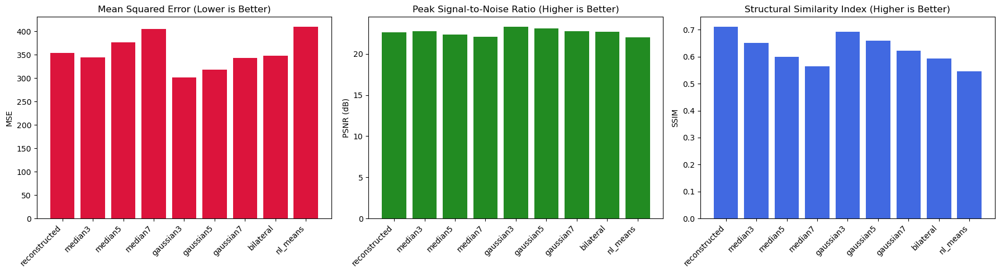

Filter comparison image saved to ../output/filter_visual_comparison.png


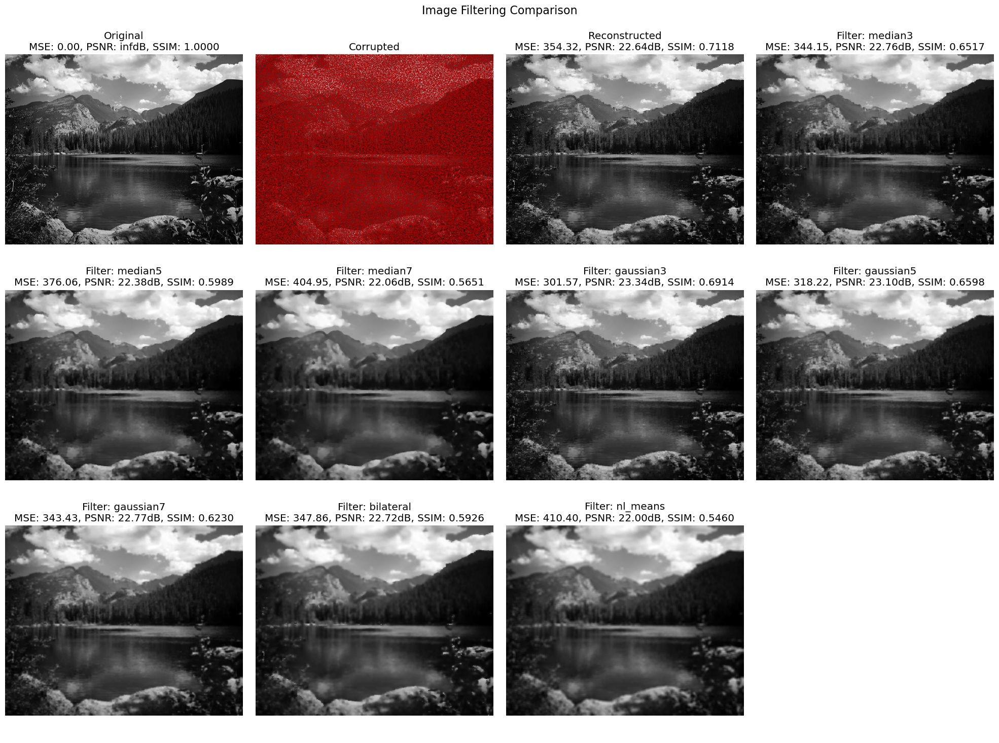

Best filter based on psnr: gaussian3 with psnr = 23.3370
Best filter based on psnr: gaussian3 with psnr = 23.3370
Best filtered image (gaussian3) saved to ../output/best_filtered_gaussian3.png

Post-processing complete!


In [ ]:
# Create an instance of the ImagePostProcessor
post_processor = ImagePostProcessor()

# Load the images from your .npy files
post_processor.load_images_from_npy(
    original_path='../assets/nature/mse_calc/original_S20.npy',
    corrupted_path='../assets/nature/mse_calc/corrupted_S20.npy',
    reconstructed_path='../assets/nature/mse_calc/recovered_S20.npy'
)

# Apply all available filters
post_processor.apply_all_filters(
    median_sizes=[3, 5, 7],  # Apply median filters with these kernel sizes
    gaussian_sizes=[3, 5, 7]  # Apply Gaussian filters with these kernel sizes
)

# Calculate metrics for all filters
metrics = post_processor.calculate_metrics()
print("\nMetrics for all filters:")
for name, result in metrics.items():
    print(f"{name}: MSE={result['mse']:.2f}, PSNR={result['psnr']:.2f}dB, SSIM={result['ssim']:.4f}")

# Plot metrics comparison
# create folder if it doesn't exist
os.makedirs('../output', exist_ok=True)
post_processor.plot_metrics_comparison(save_path="../output/filter_metrics_comparison.png")

# Display visual comparison of all filters
os.makedirs('../output', exist_ok=True)
post_processor.compare_filters(save_path="../output/filter_visual_comparison.png")

# Get and save the best filtered image based on PSNR
best_name, best_image = post_processor.get_best_filter(metric='psnr')
output_path = f"../output/best_filtered_{best_name}.png"
post_processor.save_best_image(output_path, metric='psnr')

print("\nPost-processing complete!")

Loaded images - Original shape: (200, 192), Corrupted shape: (200, 192), Reconstructed shape: (200, 192)
Median filter applied with kernel size 3 in 0.0006 seconds
Median filter applied with kernel size 5 in 0.0006 seconds
Median filter applied with kernel size 7 in 0.0017 seconds
Gaussian filter applied with kernel size 3 in 0.0001 seconds
Gaussian filter applied with kernel size 5 in 0.0002 seconds
Gaussian filter applied with kernel size 7 in 0.0002 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0009 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0190 seconds

Metrics for all filters:
reconstructed: MSE=211.92, PSNR=24.87dB, SSIM=0.8397
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=223.24, PSNR=24.64dB, SSIM=0.7946
median5: MSE=327.10, PSNR=22.98dB, SSIM=0.7048
median7: MSE=461.48, PSNR=21.49dB, SSIM=0.6178
gaussian3: MSE=207.50, PSNR=24.96dB, SSIM=0.8162
gaussian5: MSE=264.19, PSNR=23.91dB, SSIM

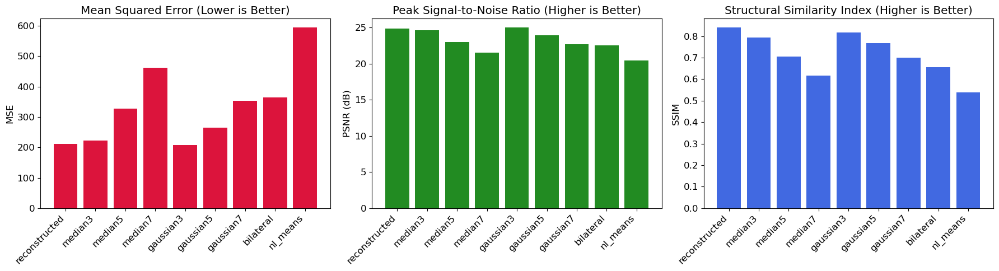

Filter comparison image saved to ../output/filter_visual_comparison.png


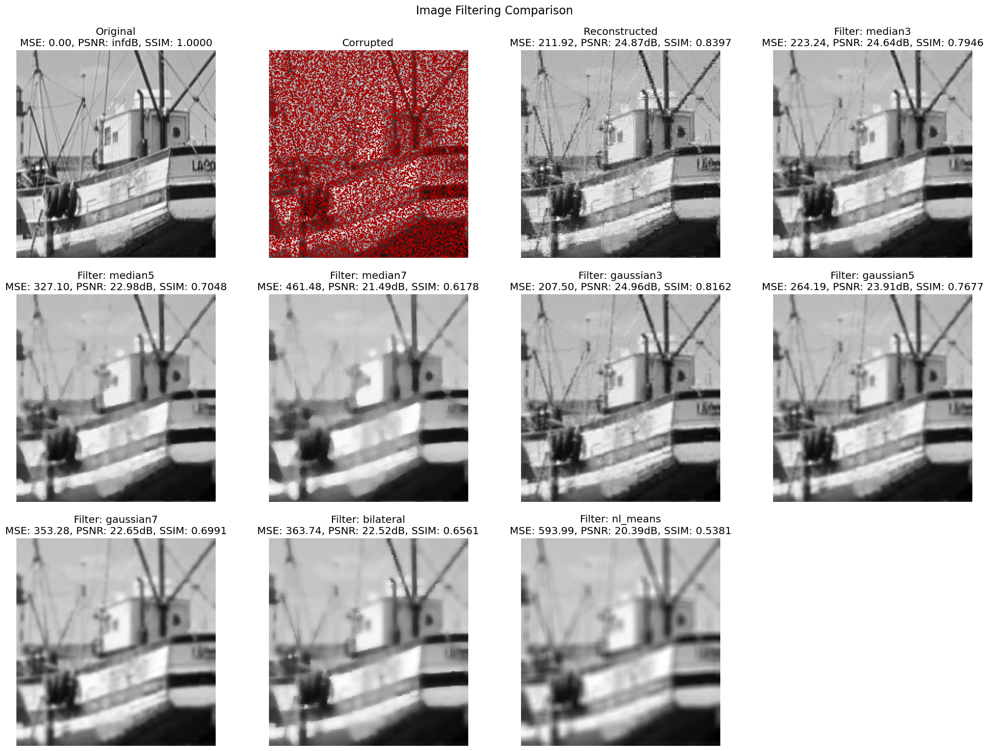

Best filter based on psnr: gaussian3 with psnr = 24.9606
Best filter based on psnr: gaussian3 with psnr = 24.9606
Best filtered image (gaussian3) saved to ../output/best_filtered_gaussian3.png

Post-processing complete!


In [8]:
# Create an instance of the ImagePostProcessor
post_processor = ImagePostProcessor()

# Load the images from your .npy files
post_processor.load_images_from_npy(
    original_path = '../assets/fishing_boat/mse_calc/original_S30.npy',
    corrupted_path = '../assets/fishing_boat/mse_calc/corrupted_S30.npy',
    reconstructed_path= '../assets/fishing_boat/mse_calc/recovered_S30.npy'
)

# Apply all available filters
post_processor.apply_all_filters(
    median_sizes=[3, 5, 7],  # Apply median filters with these kernel sizes
    gaussian_sizes=[3, 5, 7]  # Apply Gaussian filters with these kernel sizes
)

# Calculate metrics for all filters
metrics = post_processor.calculate_metrics()
print("\nMetrics for all filters:")
for name, result in metrics.items():
    print(f"{name}: MSE={result['mse']:.2f}, PSNR={result['psnr']:.2f}dB, SSIM={result['ssim']:.4f}")

# Plot metrics comparison
# create folder if it doesn't exist
os.makedirs('../output', exist_ok=True)
post_processor.plot_metrics_comparison(save_path="../output/filter_metrics_comparison.png")

# Display visual comparison of all filters
os.makedirs('../output', exist_ok=True)
post_processor.compare_filters(save_path="../output/filter_visual_comparison.png")

# Get and save the best filtered image based on PSNR
best_name, best_image = post_processor.get_best_filter(metric='psnr')
output_path = f"../output/best_filtered_{best_name}.png"
post_processor.save_best_image(output_path, metric='psnr')

print("\nPost-processing complete!")

Loaded images - Original shape: (512, 640), Corrupted shape: (512, 640), Reconstructed shape: (512, 640)
Median filter applied with kernel size 3 in 0.0024 seconds
Median filter applied with kernel size 5 in 0.0015 seconds
Median filter applied with kernel size 7 in 0.0416 seconds
Gaussian filter applied with kernel size 3 in 0.0002 seconds
Gaussian filter applied with kernel size 5 in 0.0002 seconds
Gaussian filter applied with kernel size 7 in 0.0009 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0046 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0904 seconds

Metrics for all filters:
reconstructed: MSE=864.32, PSNR=18.76dB, SSIM=0.4081
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=748.03, PSNR=19.39dB, SSIM=0.4398
median5: MSE=679.98, PSNR=19.81dB, SSIM=0.4569
median7: MSE=655.32, PSNR=19.97dB, SSIM=0.4618
gaussian3: MSE=707.42, PSNR=19.63dB, SSIM=0.4506
gaussian5: MSE=667.24, PSNR=19.89dB, SSIM

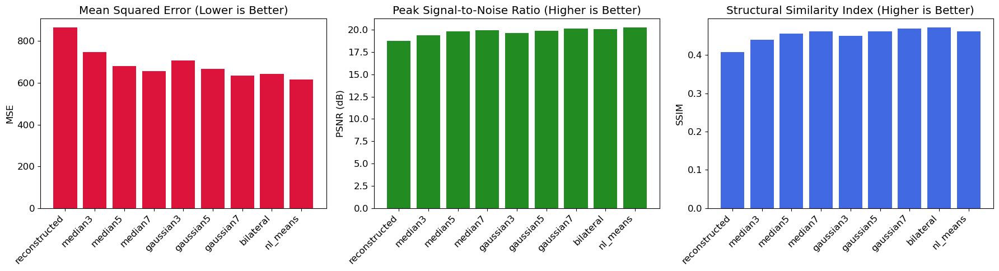

Loaded images - Original shape: (512, 640), Corrupted shape: (512, 640), Reconstructed shape: (512, 640)
Median filter applied with kernel size 3 in 0.0002 seconds
Median filter applied with kernel size 5 in 0.0007 seconds
Median filter applied with kernel size 7 in 0.0122 seconds
Gaussian filter applied with kernel size 3 in 0.0001 seconds
Gaussian filter applied with kernel size 5 in 0.0001 seconds
Gaussian filter applied with kernel size 7 in 0.0001 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0017 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0728 seconds

Metrics for all filters:
reconstructed: MSE=581.88, PSNR=20.48dB, SSIM=0.5327
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=503.68, PSNR=21.11dB, SSIM=0.5377
median5: MSE=493.79, PSNR=21.20dB, SSIM=0.5256
median7: MSE=498.83, PSNR=21.15dB, SSIM=0.5137
gaussian3: MSE=470.82, PSNR=21.40dB, SSIM=0.5592
gaussian5: MSE=462.16, PSNR=21.48dB, SSIM

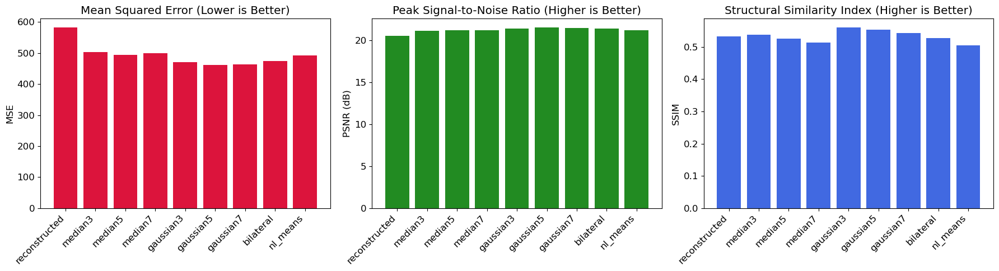

Loaded images - Original shape: (512, 640), Corrupted shape: (512, 640), Reconstructed shape: (512, 640)
Median filter applied with kernel size 3 in 0.0003 seconds
Median filter applied with kernel size 5 in 0.0008 seconds
Median filter applied with kernel size 7 in 0.0119 seconds
Gaussian filter applied with kernel size 3 in 0.0001 seconds
Gaussian filter applied with kernel size 5 in 0.0001 seconds
Gaussian filter applied with kernel size 7 in 0.0001 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0024 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0762 seconds

Metrics for all filters:
reconstructed: MSE=433.99, PSNR=21.76dB, SSIM=0.6232
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=408.48, PSNR=22.02dB, SSIM=0.5901
median5: MSE=424.46, PSNR=21.85dB, SSIM=0.5597
median7: MSE=441.90, PSNR=21.68dB, SSIM=0.5384
gaussian3: MSE=371.25, PSNR=22.43dB, SSIM=0.6236
gaussian5: MSE=379.58, PSNR=22.34dB, SSIM

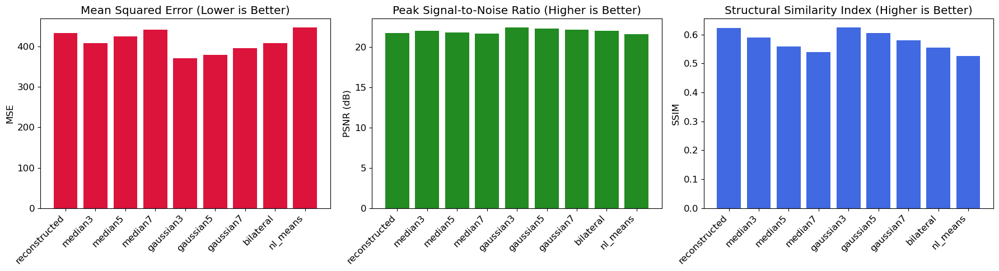

Loaded images - Original shape: (512, 640), Corrupted shape: (512, 640), Reconstructed shape: (512, 640)
Median filter applied with kernel size 3 in 0.0002 seconds
Median filter applied with kernel size 5 in 0.0008 seconds
Median filter applied with kernel size 7 in 0.0109 seconds
Gaussian filter applied with kernel size 3 in 0.0001 seconds
Gaussian filter applied with kernel size 5 in 0.0001 seconds
Gaussian filter applied with kernel size 7 in 0.0002 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0027 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0752 seconds

Metrics for all filters:
reconstructed: MSE=253.94, PSNR=24.08dB, SSIM=0.7720
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=309.64, PSNR=23.22dB, SSIM=0.6662
median5: MSE=357.31, PSNR=22.60dB, SSIM=0.6034
median7: MSE=390.68, PSNR=22.21dB, SSIM=0.5669
gaussian3: MSE=261.38, PSNR=23.96dB, SSIM=0.7185
gaussian5: MSE=291.42, PSNR=23.49dB, SSIM

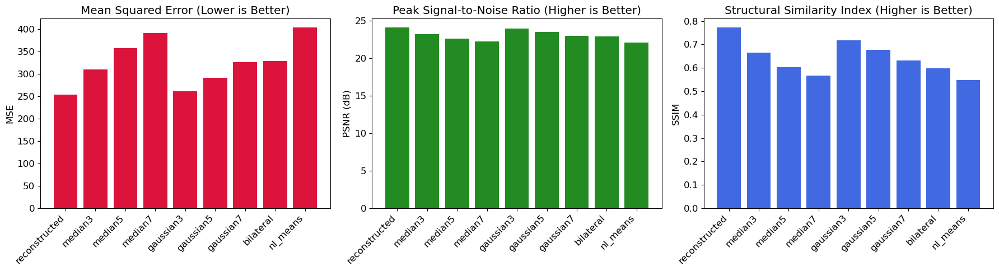

Loaded images - Original shape: (512, 640), Corrupted shape: (512, 640), Reconstructed shape: (512, 640)
Median filter applied with kernel size 3 in 0.0002 seconds
Median filter applied with kernel size 5 in 0.0013 seconds
Median filter applied with kernel size 7 in 0.0113 seconds
Gaussian filter applied with kernel size 3 in 0.0001 seconds
Gaussian filter applied with kernel size 5 in 0.0001 seconds
Gaussian filter applied with kernel size 7 in 0.0001 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0019 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0749 seconds

Metrics for all filters:
reconstructed: MSE=145.69, PSNR=26.50dB, SSIM=0.8717
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=254.75, PSNR=24.07dB, SSIM=0.7131
median5: MSE=325.97, PSNR=23.00dB, SSIM=0.6270
median7: MSE=367.81, PSNR=22.47dB, SSIM=0.5810
gaussian3: MSE=202.38, PSNR=25.07dB, SSIM=0.7759
gaussian5: MSE=246.35, PSNR=24.22dB, SSIM

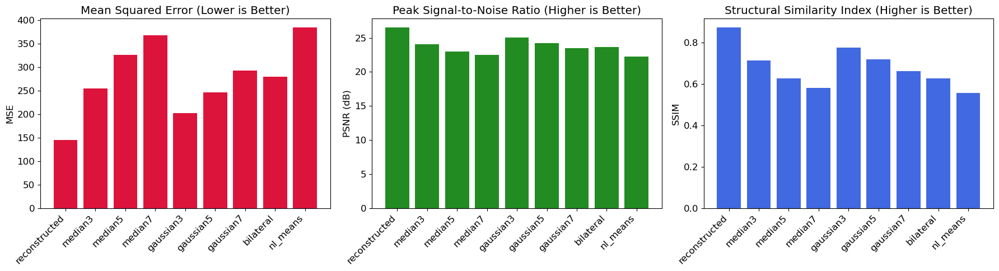

<Figure size 1200x600 with 0 Axes>

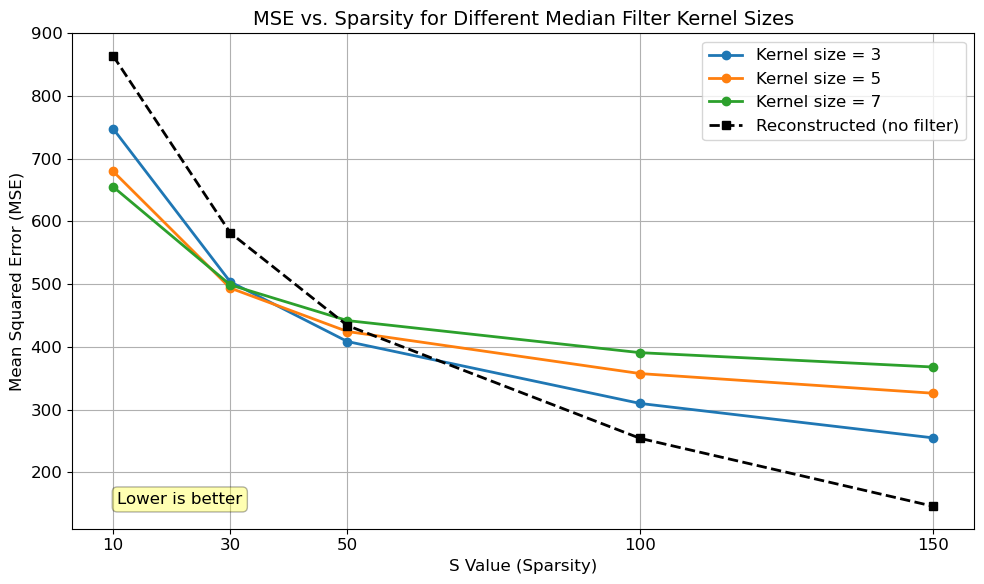

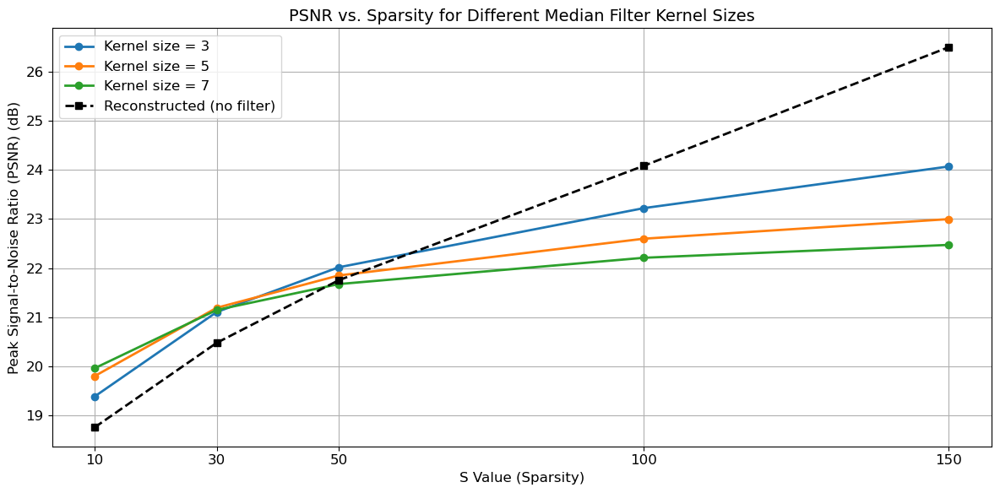

In [ ]:
# now, want to test for a same image but MSE for different S values
# want to plot S vs MSe, SSIM, PSNR

# Create an instance of the ImagePostProcessor
post_processor = ImagePostProcessor()

metrics_global = {}

# Load the images from your .npy files
for s in [10, 30, 50, 100, 150]:
    original = np.load(f'../assets/nature/mse_calc/original_S{s}.npy')
    corrupted = np.load(f'../assets/nature/mse_calc/corrupted_S{s}.npy')
    reconstructed = np.load(f'../assets/nature/mse_calc/recovered_S{s}.npy')
    
    post_processor.load_images_from_npy(
        original_path=f'../assets/nature/mse_calc/original_S{s}.npy',
        corrupted_path=f'../assets/nature/mse_calc/corrupted_S{s}.npy',
        reconstructed_path=f'../assets/nature/mse_calc/recovered_S{s}.npy'
    )
    
    # Apply all available filters
    post_processor.apply_all_filters(
        median_sizes=[3, 5, 7],  # Apply median filters with these kernel sizes
        gaussian_sizes=[3, 5, 7]  # Apply Gaussian filters with these kernel sizes
    )
    
    # Calculate metrics for all filters
    metrics = post_processor.calculate_metrics()
    print("\nMetrics for all filters:")
    for name, result in metrics.items():
        print(f"{name}: MSE={result['mse']:.2f}, PSNR={result['psnr']:.2f}dB, SSIM={result['ssim']:.4f}")
    
    # Plot metrics comparison
    # create folder if it doesn't exist
    os.makedirs('../output', exist_ok=True)
    post_processor.plot_metrics_comparison(save_path=f"../output/nature_filter_metrics_comparison_S{s}.png")
    
    # save data to be compared later
    metrics_global[s] = metrics
    
# plot S vs MSE for all k values only median filter
# Create figure
fig = plt.figure(figsize=(12, 6))

# Plot MSE for all S values
# Set up the figure
plt.figure(figsize=(10, 6))

# Extract S values and prepare data for plotting
s_values = list(metrics_global.keys())

# Plot lines for each kernel size
for kernel_size in [3, 5, 7]:
    mse_values = [metrics_global[s][f'median{kernel_size}']['mse'] for s in s_values]
    plt.plot(s_values, mse_values, marker='o', linewidth=2, label=f'Kernel size = {kernel_size}')

# Add line for reconstructed image (without filtering) as reference
mse_values_reconstructed = [metrics_global[s]['reconstructed']['mse'] for s in s_values]
plt.plot(s_values, mse_values_reconstructed, marker='s', linewidth=2, linestyle='--', 
         color='black', label='Reconstructed (no filter)')

plt.xlabel('S Value (Sparsity)', fontsize=12)
plt.ylabel('Mean Squared Error (MSE)', fontsize=12)
plt.title('MSE vs. Sparsity for Different Median Filter Kernel Sizes', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.xticks(s_values)

# Add annotations to show that lower MSE is better
plt.annotate('Lower is better', xy=(0.05, 0.05), xycoords='axes fraction', 
             fontsize=12, bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.3))

plt.tight_layout()
plt.savefig('../output/nature_mse_vs_sparsity_median_filter.png')
plt.show()

# plot S vs PSNR for all k values only median filter
# Create figure
fig = plt.figure(figsize=(12, 6))
for kernel_size in [3, 5, 7]:
    psnr_values = [metrics_global[s][f'median{kernel_size}']['psnr'] for s in s_values]
    plt.plot(s_values, psnr_values, marker='o', linewidth=2, label=f'Kernel size = {kernel_size}')

# Add line for reconstructed image (without filtering) as reference
psnr_values_reconstructed = [metrics_global[s]['reconstructed']['psnr'] for s in s_values]
plt.plot(s_values, psnr_values_reconstructed, marker='s', linewidth=2, linestyle='--', 
         color='black', label='Reconstructed (no filter)')
plt.xlabel('S Value (Sparsity)', fontsize=12)
plt.ylabel('Peak Signal-to-Noise Ratio (PSNR) (dB)', fontsize=12)
plt.title('PSNR vs. Sparsity for Different Median Filter Kernel Sizes', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.xticks(s_values)
plt.tight_layout()

plt.savefig('../output/nature_psnr_vs_sparsity_median_filter.png')
plt.show()

    

Loaded images - Original shape: (200, 192), Corrupted shape: (200, 192), Reconstructed shape: (200, 192)
Median filter applied with kernel size 3 in 0.0001 seconds
Median filter applied with kernel size 5 in 0.0002 seconds
Median filter applied with kernel size 7 in 0.0012 seconds
Gaussian filter applied with kernel size 3 in 0.0001 seconds
Gaussian filter applied with kernel size 5 in 0.0000 seconds
Gaussian filter applied with kernel size 7 in 0.0001 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0007 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0097 seconds

Metrics for all filters:
reconstructed: MSE=907.07, PSNR=18.55dB, SSIM=0.5400
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=684.74, PSNR=19.78dB, SSIM=0.5851
median5: MSE=651.43, PSNR=19.99dB, SSIM=0.5685
median7: MSE=680.29, PSNR=19.80dB, SSIM=0.5355
gaussian3: MSE=643.35, PSNR=20.05dB, SSIM=0.5962
gaussian5: MSE=622.26, PSNR=20.19dB, SSIM

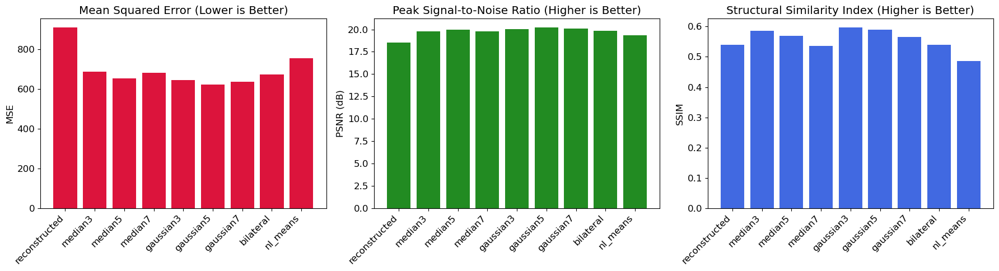

Loaded images - Original shape: (200, 192), Corrupted shape: (200, 192), Reconstructed shape: (200, 192)
Median filter applied with kernel size 3 in 0.0001 seconds
Median filter applied with kernel size 5 in 0.0002 seconds
Median filter applied with kernel size 7 in 0.0011 seconds
Gaussian filter applied with kernel size 3 in 0.0000 seconds
Gaussian filter applied with kernel size 5 in 0.0000 seconds
Gaussian filter applied with kernel size 7 in 0.0001 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0007 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0090 seconds

Metrics for all filters:
reconstructed: MSE=431.42, PSNR=21.78dB, SSIM=0.7194
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=374.02, PSNR=22.40dB, SSIM=0.7168
median5: MSE=437.14, PSNR=21.72dB, SSIM=0.6560
median7: MSE=529.57, PSNR=20.89dB, SSIM=0.5906
gaussian3: MSE=344.19, PSNR=22.76dB, SSIM=0.7365
gaussian5: MSE=377.95, PSNR=22.36dB, SSIM

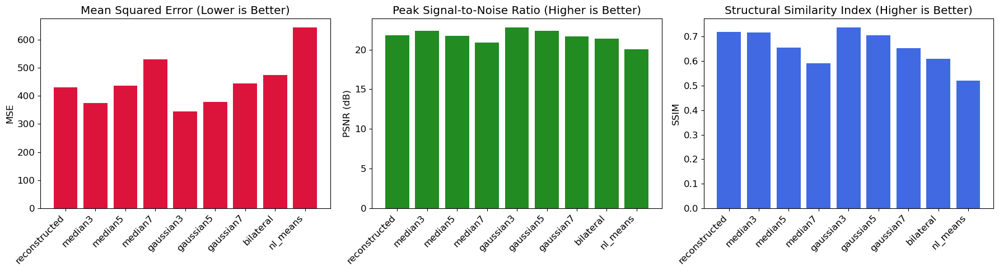

Loaded images - Original shape: (200, 192), Corrupted shape: (200, 192), Reconstructed shape: (200, 192)
Median filter applied with kernel size 3 in 0.0001 seconds
Median filter applied with kernel size 5 in 0.0002 seconds
Median filter applied with kernel size 7 in 0.0011 seconds
Gaussian filter applied with kernel size 3 in 0.0000 seconds
Gaussian filter applied with kernel size 5 in 0.0000 seconds
Gaussian filter applied with kernel size 7 in 0.0000 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0007 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0084 seconds

Metrics for all filters:
reconstructed: MSE=211.92, PSNR=24.87dB, SSIM=0.8397
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=223.24, PSNR=24.64dB, SSIM=0.7946
median5: MSE=327.10, PSNR=22.98dB, SSIM=0.7048
median7: MSE=461.48, PSNR=21.49dB, SSIM=0.6178
gaussian3: MSE=207.50, PSNR=24.96dB, SSIM=0.8162
gaussian5: MSE=264.19, PSNR=23.91dB, SSIM

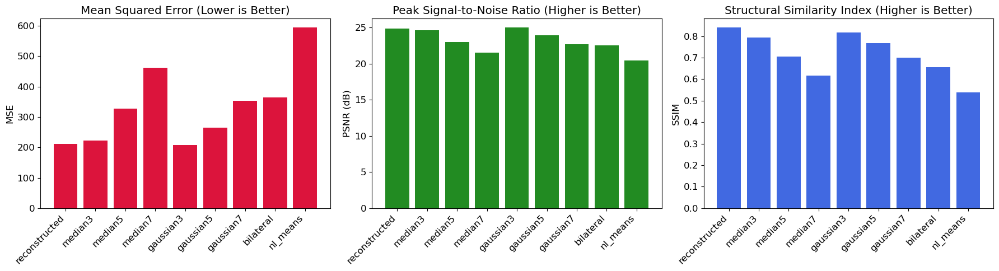

Loaded images - Original shape: (200, 192), Corrupted shape: (200, 192), Reconstructed shape: (200, 192)
Median filter applied with kernel size 3 in 0.0001 seconds
Median filter applied with kernel size 5 in 0.0002 seconds
Median filter applied with kernel size 7 in 0.0011 seconds
Gaussian filter applied with kernel size 3 in 0.0000 seconds
Gaussian filter applied with kernel size 5 in 0.0000 seconds
Gaussian filter applied with kernel size 7 in 0.0001 seconds
Bilateral filter applied with d=9, sigma_color=75, sigma_space=75 in 0.0006 seconds
Non-Local Means filter applied with h_factor=1.15, patch_size=5, patch_distance=3 in 0.0087 seconds

Metrics for all filters:
reconstructed: MSE=36.42, PSNR=32.52dB, SSIM=0.9672
corrupted: MSE=nan, PSNR=nandB, SSIM=nan
median3: MSE=125.35, PSNR=27.15dB, SSIM=0.8615
median5: MSE=271.60, PSNR=23.79dB, SSIM=0.7352
median7: MSE=437.82, PSNR=21.72dB, SSIM=0.6332
gaussian3: MSE=114.46, PSNR=27.54dB, SSIM=0.8867
gaussian5: MSE=188.99, PSNR=25.37dB, SSIM=

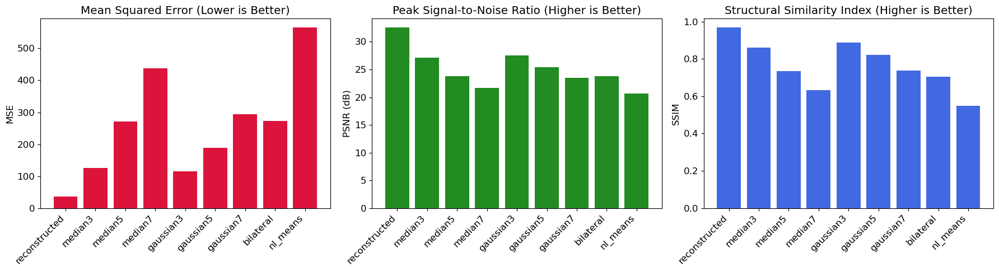

<Figure size 1200x600 with 0 Axes>

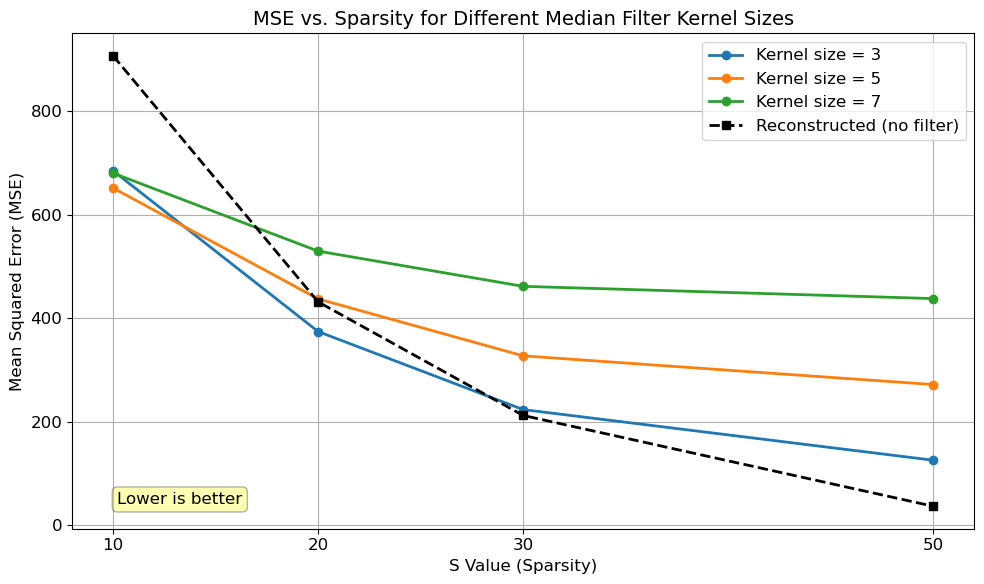

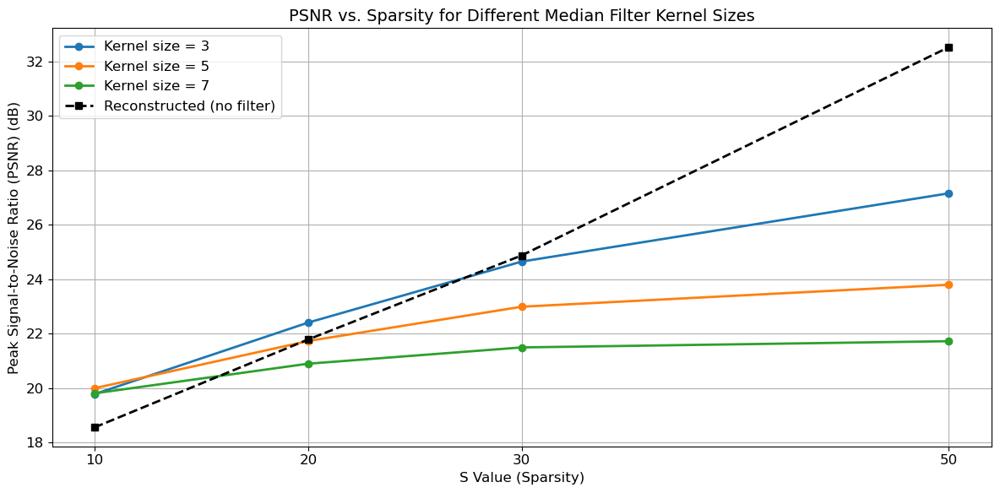

In [ ]:
# now, want to test for a same image but MSE for different S values
# want to plot S vs MSe, SSIM, PSNR

# Create an instance of the ImagePostProcessor
post_processor = ImagePostProcessor()

metrics_global = {}

# Load the images from your .npy files
for s in [10,20, 30, 50]:
    original = np.load(f'../assets/fishing_boat/mse_calc/original_S{s}.npy')
    corrupted = np.load(f'../assets/fishing_boat/mse_calc/corrupted_S{s}.npy')
    reconstructed = np.load(f'../assets/fishing_boat/mse_calc/recovered_S{s}.npy')
    
    post_processor.load_images_from_npy(
        original_path=f'../assets/fishing_boat/mse_calc/original_S{s}.npy',
        corrupted_path=f'../assets/fishing_boat/mse_calc/corrupted_S{s}.npy',
        reconstructed_path=f'../assets/fishing_boat/mse_calc/recovered_S{s}.npy'
    )
    
    # Apply all available filters
    post_processor.apply_all_filters(
        median_sizes=[3, 5, 7],  # Apply median filters with these kernel sizes
        gaussian_sizes=[3, 5, 7]  # Apply Gaussian filters with these kernel sizes
    )
    
    # Calculate metrics for all filters
    metrics = post_processor.calculate_metrics()
    print("\nMetrics for all filters:")
    for name, result in metrics.items():
        print(f"{name}: MSE={result['mse']:.2f}, PSNR={result['psnr']:.2f}dB, SSIM={result['ssim']:.4f}")
    
    # Plot metrics comparison
    # create folder if it doesn't exist
    os.makedirs('../output', exist_ok=True)
    post_processor.plot_metrics_comparison(save_path=f"../output/fish_filter_metrics_comparison_S{s}.png")
    
    # save data to be compared later
    metrics_global[s] = metrics
    
# plot S vs MSE for all k values only median filter
# Create figure
fig = plt.figure(figsize=(12, 6))

# Plot MSE for all S values
# Set up the figure
plt.figure(figsize=(10, 6))

# Extract S values and prepare data for plotting
s_values = list(metrics_global.keys())

# Plot lines for each kernel size
for kernel_size in [3, 5, 7]:
    mse_values = [metrics_global[s][f'median{kernel_size}']['mse'] for s in s_values]
    plt.plot(s_values, mse_values, marker='o', linewidth=2, label=f'Kernel size = {kernel_size}')

# Add line for reconstructed image (without filtering) as reference
mse_values_reconstructed = [metrics_global[s]['reconstructed']['mse'] for s in s_values]
plt.plot(s_values, mse_values_reconstructed, marker='s', linewidth=2, linestyle='--', 
         color='black', label='Reconstructed (no filter)')

plt.xlabel('S Value (Sparsity)', fontsize=12)
plt.ylabel('Mean Squared Error (MSE)', fontsize=12)
plt.title('MSE vs. Sparsity for Different Median Filter Kernel Sizes', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.xticks(s_values)

# Add annotations to show that lower MSE is better
plt.annotate('Lower is better', xy=(0.05, 0.05), xycoords='axes fraction', 
             fontsize=12, bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.3))

plt.tight_layout()
plt.savefig('../output/fish_mse_vs_sparsity_median_filter.png')
plt.show()

# plot S vs PSNR for all k values only median filter
# Create figure
fig = plt.figure(figsize=(12, 6))
for kernel_size in [3, 5, 7]:
    psnr_values = [metrics_global[s][f'median{kernel_size}']['psnr'] for s in s_values]
    plt.plot(s_values, psnr_values, marker='o', linewidth=2, label=f'Kernel size = {kernel_size}')

# Add line for reconstructed image (without filtering) as reference
psnr_values_reconstructed = [metrics_global[s]['reconstructed']['psnr'] for s in s_values]
plt.plot(s_values, psnr_values_reconstructed, marker='s', linewidth=2, linestyle='--', 
         color='black', label='Reconstructed (no filter)')
plt.xlabel('S Value (Sparsity)', fontsize=12)
plt.ylabel('Peak Signal-to-Noise Ratio (PSNR) (dB)', fontsize=12)
plt.title('PSNR vs. Sparsity for Different Median Filter Kernel Sizes', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.xticks(s_values)
plt.tight_layout()

plt.savefig('../output/fish_psnr_vs_sparsity_median_filter.png')
plt.show()

    